In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/aliyachomo/plant-villegedataset/label_num_to_disease_map.json
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train.csv
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test.csv
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1235188286.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1563395006.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1589421421.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1877332484.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/2319781928.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/3682266975.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/2780925336.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1551899349.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/277623554

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping


2026-05-15 12:31:21.279770: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1778848281.490498      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778848281.551731      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778848282.044667      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778848282.044712      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778848282.044715      57 computation_placer.cc:177] computation placer alr

In [3]:
# =========================================================
# 3. IMPORT LIBRARIES
# =========================================================

import os
import json
import random
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

import tensorflow as tf

from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Model

from tensorflow.keras.layers import (
    Dense,
    Dropout,
    BatchNormalization,
    GlobalAveragePooling2D,
    Input
)

from tensorflow.keras.optimizers import Adam

from tensorflow.keras.regularizers import l2

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

warnings.filterwarnings('ignore')

In [4]:
import os

for dirname, dirs, files in os.walk('/kaggle/input/datasets/aliyachomo/plant-villegedataset/'):
    print("FOLDER:", dirname)

    for file in files[:5]:
        print("   ", file)

    print("-" * 50)

FOLDER: /kaggle/input/datasets/aliyachomo/plant-villegedataset/
    label_num_to_disease_map.json
    Train.csv
    Test.csv
--------------------------------------------------
FOLDER: /kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean
    1235188286.jpg
    1563395006.jpg
    1589421421.jpg
    1877332484.jpg
    2319781928.jpg
--------------------------------------------------
FOLDER: /kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean
    1058931181.jpg
    688489193.jpg
    3507045403.jpg
    137128883.jpg
    495897960.jpg
--------------------------------------------------


In [5]:
# =========================================================
# DATASET PATHS
# =========================================================

MAIN_DATASET_PATH = "/kaggle/input/datasets/aliyachomo/plant-villegedataset/"

TRAIN_CSV = MAIN_DATASET_PATH + "/Train.csv"
TEST_CSV = MAIN_DATASET_PATH + "/Test.csv"

TRAIN_DIR = MAIN_DATASET_PATH + "/Train_Images_clean"
TEST_DIR = MAIN_DATASET_PATH + "/Test_Images_clean"

LABEL_JSON = MAIN_DATASET_PATH + "/label_num_to_disease_map.json"

In [6]:
import os

print(os.path.exists(TRAIN_CSV))
print(os.path.exists(TEST_CSV))
print(os.path.exists(TRAIN_DIR))
print(os.path.exists(TEST_DIR))
print(os.path.exists(LABEL_JSON))

True
True
True
True
True


In [7]:
import pandas as pd

train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

print(train_df.head())
print(test_df.head())

               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4
               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3


In [8]:
with open(LABEL_JSON, "r") as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


In [9]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


In [10]:
print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 4000
Test: 1000

Class distribution (Train):
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


In [11]:
import os

# Correct folders
train_dir = TRAIN_DIR

test_dir = TEST_DIR


# Function to count images
def count_images(folder):

    total = 0

    for root, dirs, files in os.walk(folder):

        images = [
            f for f in files
            if f.lower().endswith(
                ('.png', '.jpg', '.jpeg')
            )
        ]

        total += len(images)

    return total


# Print counts
print("✅ Total Train Clean Images:",
      count_images(train_dir))

print("✅ Total Test Clean Images:",
      count_images(test_dir))

✅ Total Train Clean Images: 4000
✅ Total Test Clean Images: 1000


In [12]:
# =========================================================
# COUNT LABELS
# =========================================================

counts = train_df["Labels"].value_counts().sort_index()

# =========================================================
# CLASS NAMES
# =========================================================

names = [label_map[str(i)] for i in counts.index]

values = counts.values

# =========================================================
# DISPLAY
# =========================================================

for name, value in zip(names, values):
    print(name, ":", value)

CBB : 800
CBSD : 800
CGM : 800
CMD : 800
Healthy : 800


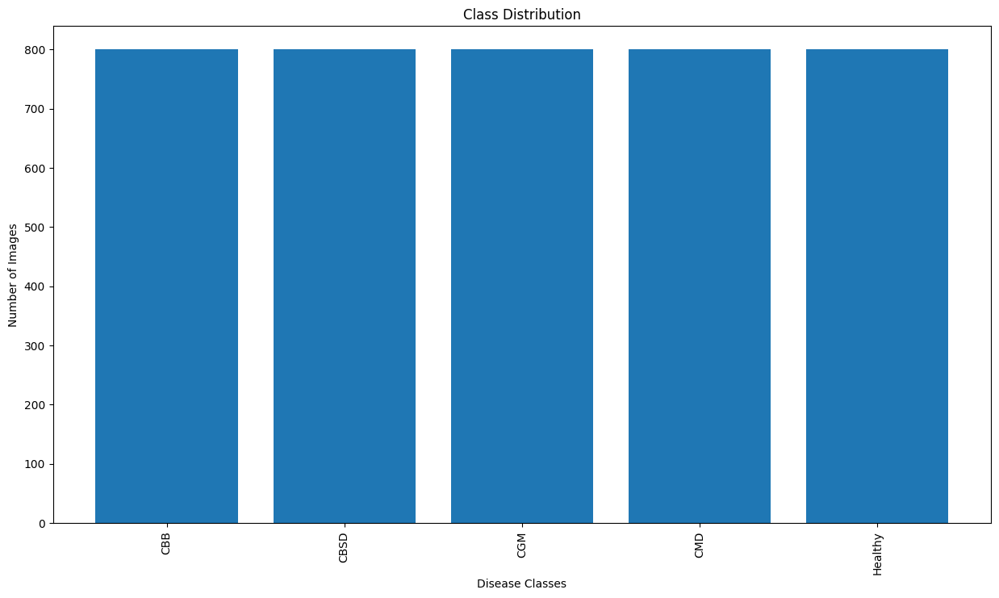

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,8))

plt.bar(names, values)

plt.xticks(rotation=90)

plt.title("Class Distribution")
plt.xlabel("Disease Classes")
plt.ylabel("Number of Images")

plt.show()

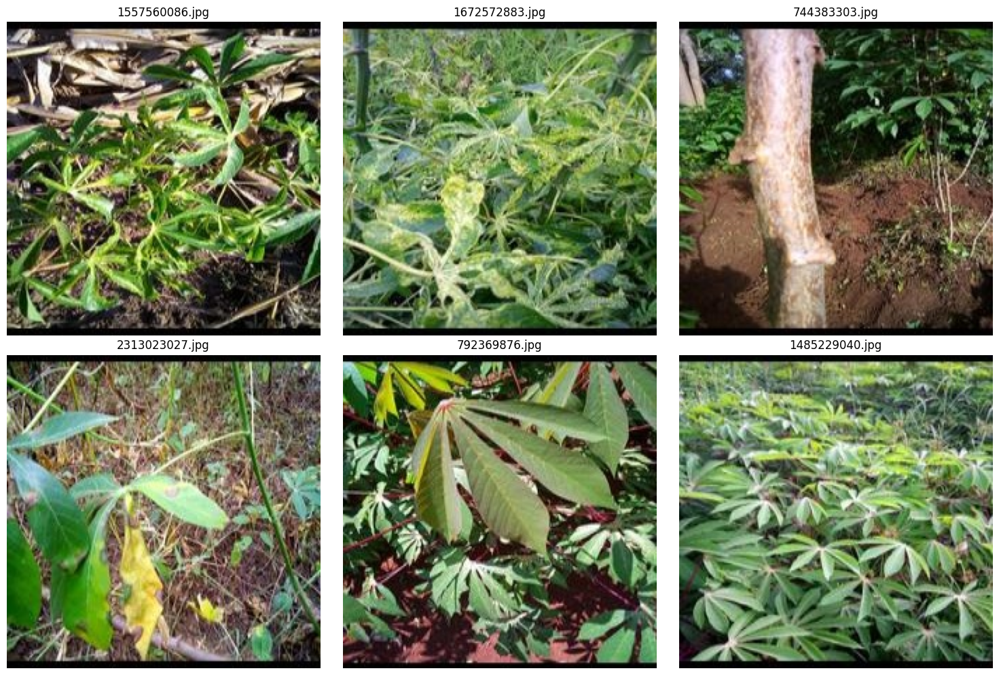

In [14]:
import matplotlib.pyplot as plt
import os
import cv2
import random

# =========================================================
# FOLDER PATH
# =========================================================

folder = "/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean/"

# =========================================================
# GET IMAGE FILES
# =========================================================

files = [

    f for f in os.listdir(folder)

    if f.lower().endswith(
        ('.png', '.jpg', '.jpeg')
    )

]

# =========================================================
# RANDOMLY SELECT 6 IMAGES
# =========================================================

sample_files = random.sample(files, 6)

# =========================================================
# PLOT IMAGES
# =========================================================

plt.figure(figsize=(15,10))

for i, file in enumerate(sample_files):

    # Full image path
    img_path = os.path.join(folder, file)

    # Read image
    img = cv2.imread(img_path)

    # Convert BGR → RGB
    img = cv2.cvtColor(
        img,
        cv2.COLOR_BGR2RGB
    )

    # Plot image
    plt.subplot(2, 3, i+1)

    plt.imshow(img)

    plt.title(file)

    plt.axis("off")

plt.tight_layout()

plt.show()

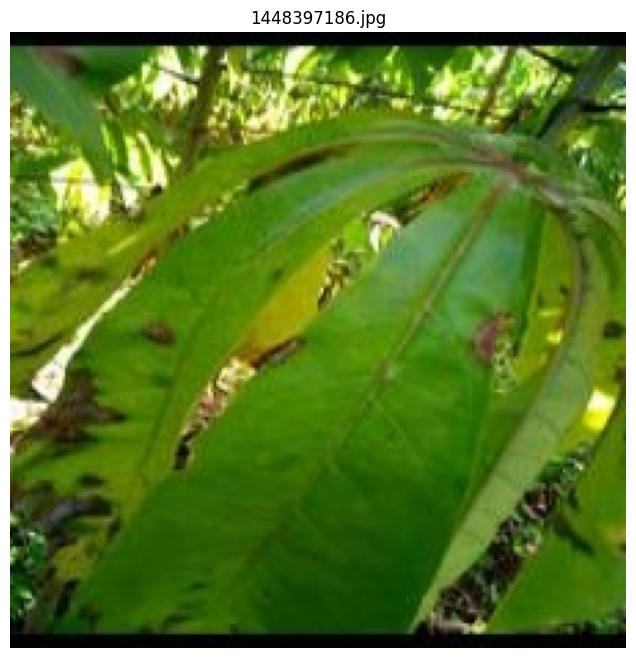

In [22]:
import matplotlib.pyplot as plt
import cv2
import os
import random

# =========================================================
# FOLDER PATH
# =========================================================

folder = "/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean/"

# =========================================================
# GET IMAGE FILES
# =========================================================

files = [

    f for f in os.listdir(folder)

    if f.lower().endswith(
        ('.png', '.jpg', '.jpeg')
    )

]

# =========================================================
# SELECT ONE RANDOM IMAGE
# =========================================================

file = random.choice(files)

# Full image path
img_path = os.path.join(folder, file)

# =========================================================
# READ IMAGE
# =========================================================

img = cv2.imread(img_path)

# Convert BGR → RGB
img = cv2.cvtColor(
    img,
    cv2.COLOR_BGR2RGB
)

# =========================================================
# DISPLAY IMAGE
# =========================================================

plt.figure(figsize=(8,8))

plt.imshow(img)

plt.title(file)

plt.axis("off")

plt.show()

Classes: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)]


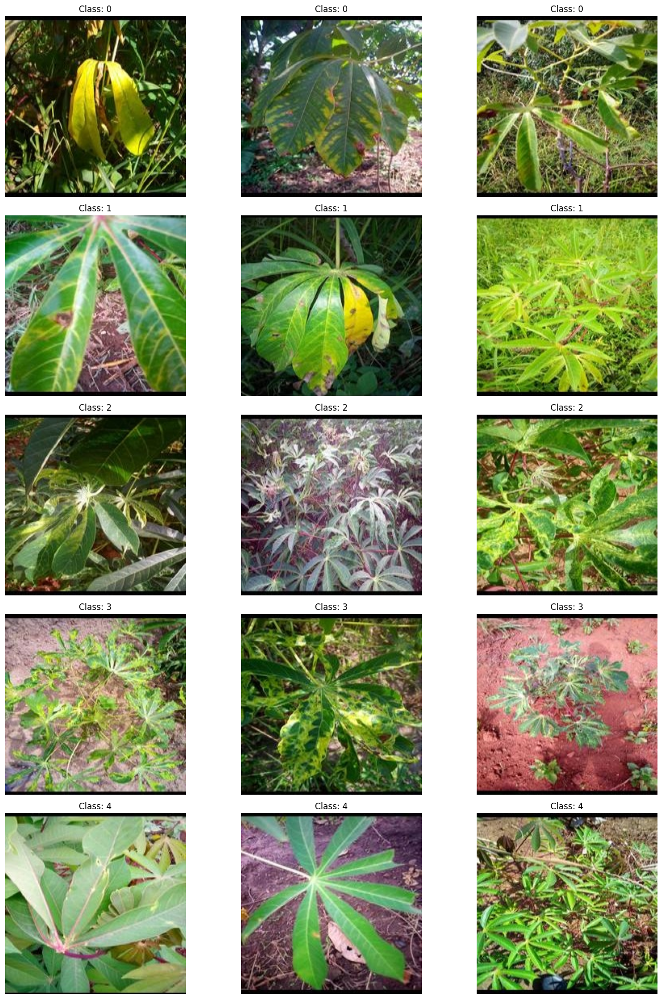

In [24]:
import matplotlib.pyplot as plt
import cv2
import os
import pandas as pd

# =========================================================
# IMAGE FOLDER
# =========================================================

folder = "/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean/"

# =========================================================
# LOAD CSV
# =========================================================

train_csv_path = "/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train.csv"

train_df = pd.read_csv(train_csv_path)

# =========================================================
# GET UNIQUE CLASSES
# =========================================================

classes = sorted(train_df['Labels'].unique())

print("Classes:", classes)

# =========================================================
# CREATE FIGURE
# =========================================================

plt.figure(figsize=(15,20))

plot_index = 1

# =========================================================
# LOOP THROUGH EACH CLASS
# =========================================================

for cls in classes:

    # Get 3 images from this class
    class_images = train_df[
        train_df['Labels'] == cls
    ].sample(3, random_state=42)

    # =====================================================
    # SHOW IMAGES
    # =====================================================

    for _, row in class_images.iterrows():

        image_name = row['ID']

        img_path = os.path.join(
            folder,
            image_name
        )

        # Read image
        img = cv2.imread(img_path)

        # Convert BGR → RGB
        img = cv2.cvtColor(
            img,
            cv2.COLOR_BGR2RGB
        )

        # Plot
        plt.subplot(
            len(classes),
            3,
            plot_index
        )

        plt.imshow(img)

        plt.title(f"Class: {cls}")

        plt.axis("off")

        plot_index += 1

# =========================================================
# SHOW IMAGES
# =========================================================

plt.tight_layout()

plt.show()

In [26]:
import tensorflow as tf
import pandas as pd
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input

from tensorflow.keras.layers import (
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    BatchNormalization
)

from tensorflow.keras.models import Model

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

In [27]:
import pandas as pd
from sklearn.model_selection import train_test_split

In [28]:
train_dir = TRAIN_DIR

In [29]:
df = pd.read_csv(TRAIN_CSV)

In [30]:
train_df, val_df = train_test_split(

    df,

    test_size=0.2,

    random_state=42,

    stratify=df['Labels']
)

In [31]:
print(train_df.head())
print(val_df.head())
print(test_df.head())

                  ID  Labels
3552  2616538732.jpg       1
1183  1536703688.jpg       2
3649    61357519.jpg       4
3597  4266856745.jpg       1
1882   186394398.jpg       0
                  ID  Labels
1327  4050718274.jpg       2
1040  4159778976.jpg       3
1920  2055911260.jpg       2
3212  3116498490.jpg       0
164   3854553332.jpg       4
               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3


In [32]:
train_df['Labels'] = train_df['Labels'].astype(str)
val_df['Labels'] = val_df['Labels'].astype(str)
test_df['Labels'] = test_df['Labels'].astype(str)

print("--- After label type conversion ---")
print("train_df Labels dtype:", train_df['Labels'].dtype)
print("train_df Labels unique values:", train_df['Labels'].unique())
print("train_df Labels value counts:\n", train_df['Labels'].value_counts())
print("\nval_df Labels dtype:", val_df['Labels'].dtype)
print("val_df Labels unique values:", val_df['Labels'].unique())
print("val_df Labels value counts:\n", val_df['Labels'].value_counts())
print("\ntest_df Labels dtype:", test_df['Labels'].dtype)
print("test_df Labels unique values:", test_df['Labels'].unique())
print("test_df Labels value counts:\n", test_df['Labels'].value_counts())

--- After label type conversion ---
train_df Labels dtype: object
train_df Labels unique values: ['1' '2' '4' '0' '3']
train_df Labels value counts:
 Labels
1    640
2    640
4    640
0    640
3    640
Name: count, dtype: int64

val_df Labels dtype: object
val_df Labels unique values: ['2' '3' '0' '4' '1']
val_df Labels value counts:
 Labels
2    160
3    160
0    160
4    160
1    160
Name: count, dtype: int64

test_df Labels dtype: object
test_df Labels unique values: ['3' '0' '4' '2' '1']
test_df Labels value counts:
 Labels
3    200
0    200
4    200
2    200
1    200
Name: count, dtype: int64


In [33]:
print(train_df.dtypes)
print(val_df.dtypes)
print(test_df.dtypes)

ID        object
Labels    object
dtype: object
ID        object
Labels    object
dtype: object
ID        object
Labels    object
dtype: object


In [34]:
from sklearn.model_selection import train_test_split

# =========================================================
# RANDOM SEED
# =========================================================

SEED = 42

# =========================================================
# TRAIN VALIDATION SPLIT
# =========================================================

train_split_df, val_df = train_test_split(
    train_df,
    test_size=0.2,
    random_state=SEED,
    stratify=train_df['Labels']
)

# =========================================================
# DISPLAY COUNTS
# =========================================================

print('Train Images :', len(train_split_df))
print('Validation Images :', len(val_df))
print('Test Images :', len(test_df))

Train Images : 2560
Validation Images : 640
Test Images : 1000


In [35]:
IMG_SIZE = 224
BATCH_SIZE = 32

In [36]:
import os

print(os.listdir(train_dir)[:5])

['1058931181.jpg', '688489193.jpg', '3507045403.jpg', '137128883.jpg', '495897960.jpg']


In [37]:
sample_image = train_df.iloc[0]['ID']

image_path = os.path.join(train_dir, sample_image)

print(image_path)

print(os.path.exists(image_path))

/kaggle/input/datasets/aliyachomo/plant-villegedataset//Train_Images_clean/2616538732.jpg
True


In [38]:
print(test_df.head())

               ID Labels
0  2595356168.jpg      3
1   794817264.jpg      0
2  4270972443.jpg      4
3  3540803278.jpg      0
4  2142522228.jpg      3


In [39]:
sample_test = test_df.iloc[0]['ID']

import os

print(sample_test)

print(os.path.join(train_dir, sample_test))

print(os.path.exists(os.path.join(train_dir, sample_test)))

2595356168.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset//Train_Images_clean/2595356168.jpg
False


In [40]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

valid_datagen = ImageDataGenerator(
    rescale=1./255
)

In [41]:
# =========================================================
# IMPORTANT FIXES
# =========================================================

# 1. Convert labels to string
# 2. Use EfficientNet preprocess_input
# 3. Remove unnecessary classes parameter
# 4. Test generator should not use Labels if labels unavailable

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications.efficientnet import preprocess_input

# =========================================================
# CONVERT LABELS TO STRING
# =========================================================

train_df['Labels'] = train_df['Labels'].astype(str)

val_df['Labels'] = val_df['Labels'].astype(str)

# Only if test labels exist
if 'Labels' in test_df.columns:
    test_df['Labels'] = test_df['Labels'].astype(str)

# =========================================================
# TRAIN DATA GENERATOR
# =========================================================

train_datagen = ImageDataGenerator(

    preprocessing_function=preprocess_input,

    rotation_range=20,

    zoom_range=0.2,

    horizontal_flip=True

)

# =========================================================
# VALIDATION / TEST GENERATOR
# =========================================================

valid_datagen = ImageDataGenerator(

    preprocessing_function=preprocess_input

)

# =========================================================
# TRAIN GENERATOR
# =========================================================

train_generator = train_datagen.flow_from_dataframe(

    dataframe=train_df,

    directory=TRAIN_DIR,

    x_col='ID',

    y_col='Labels',

    target_size=(IMG_SIZE, IMG_SIZE),

    batch_size=BATCH_SIZE,

    class_mode='categorical',

    shuffle=True,

    seed=SEED

)

# =========================================================
# VALIDATION GENERATOR
# =========================================================

valid_generator = valid_datagen.flow_from_dataframe(

    dataframe=val_df,

    directory=TRAIN_DIR,

    x_col='ID',

    y_col='Labels',

    target_size=(IMG_SIZE, IMG_SIZE),

    batch_size=BATCH_SIZE,

    class_mode='categorical',

    shuffle=False

)

# =========================================================
# TEST GENERATOR
# =========================================================

# If test labels are NOT available
if 'Labels' not in test_df.columns:

    test_generator = valid_datagen.flow_from_dataframe(

        dataframe=test_df,

        directory=TEST_DIR,

        x_col='ID',

        y_col=None,

        target_size=(IMG_SIZE, IMG_SIZE),

        batch_size=BATCH_SIZE,

        class_mode=None,

        shuffle=False

    )

# If test labels ARE available
else:

    test_generator = valid_datagen.flow_from_dataframe(

        dataframe=test_df,

        directory=TEST_DIR,

        x_col='ID',

        y_col='Labels',

        target_size=(IMG_SIZE, IMG_SIZE),

        batch_size=BATCH_SIZE,

        class_mode='categorical',

        shuffle=False

    )

# =========================================================
# CHECK CLASS INFO
# =========================================================

print("Class Indices:")
print(train_generator.class_indices)

print("Number of Classes:")
print(len(train_generator.class_indices))

Found 3200 validated image filenames belonging to 5 classes.
Found 640 validated image filenames belonging to 5 classes.
Found 1000 validated image filenames belonging to 5 classes.
Class Indices:
{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4}
Number of Classes:
5


In [42]:
# =========================================================
# CHECK TRAIN GENERATOR BATCH
# =========================================================

x_batch, y_batch = next(train_generator)

print("Image batch shape :", x_batch.shape)
print("Label batch shape :", y_batch.shape)

print("\nFirst 5 labels:\n")
print(y_batch[:5])

Image batch shape : (32, 224, 224, 3)
Label batch shape : (32, 5)

First 5 labels:

[[0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]]


In [45]:
# =========================================================
# IMPORTS FOR MobileNetV3Small
# =========================================================

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf

from sklearn.model_selection import train_test_split

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    BatchNormalization
)

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

from tensorflow.keras.optimizers import Adam

from tensorflow.keras.regularizers import l2

from tensorflow.keras.initializers import HeNormal

In [46]:
# =========================================================
# CHECK TENSORFLOW + GPU
# =========================================================

import tensorflow as tf

print("TensorFlow Version :", tf.__version__)

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("GPU Available :", gpus)
else:
    print("GPU Not Available")

TensorFlow Version : 2.19.0
GPU Available : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [51]:
# =========================================================
# FIND H5 FILE
# =========================================================

for root, dirs, files in os.walk("/kaggle/input"):

    for file in files:

        if file.endswith(".h5"):

            print(os.path.join(root, file))

/kaggle/input/datasets/aliyachomo/mobilenetv3small/weights_mobilenet_v3_small_224_1.0_float_no_top_v2.h5


In [56]:
# =========================================================
# LOAD MobileNetV3Small
# =========================================================

base_model = MobileNetV3Small(

    weights=None,

    include_top=False,

    input_shape=(224, 224, 3)

)

In [59]:
# =========================================================
# SHOW ALL FILES INSIDE KAGGLE INPUT
# =========================================================

import os

for root, dirs, files in os.walk("/kaggle/input"):

    print("\nFOLDER:", root)

    for file in files:

        print(file)


FOLDER: /kaggle/input

FOLDER: /kaggle/input/datasets

FOLDER: /kaggle/input/datasets/aliyachomo

FOLDER: /kaggle/input/datasets/aliyachomo/plant-villegedataset
label_num_to_disease_map.json
Train.csv
Test.csv

FOLDER: /kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean
1235188286.jpg
1563395006.jpg
1589421421.jpg
1877332484.jpg
2319781928.jpg
3682266975.jpg
2780925336.jpg
1551899349.jpg
2776235541.jpg
3770389028.jpg
3589093765.jpg
2586069156.jpg
1908179787.jpg
2045367383.jpg
3092974289.jpg
2015754935.jpg
416062259.jpg
1040315063.jpg
523032468.jpg
1948267522.jpg
3044190781.jpg
2213611476.jpg
396528848.jpg
809104607.jpg
3651930392.jpg
2048902199.jpg
3162831635.jpg
101253257.jpg
874716908.jpg
3315504598.jpg
3056477095.jpg
1387417051.jpg
923499439.jpg
2536030910.jpg
3418474102.jpg
2149765362.jpg
3607291396.jpg
1498477767.jpg
1542437080.jpg
1974242714.jpg
3719761839.jpg
900445109.jpg
965133347.jpg
1796327295.jpg
504400425.jpg
3653286071.jpg
2998282647.jpg
3887613980.j

In [60]:
# =========================================================
# LOAD MobileNetV3Small MODEL
# =========================================================

from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    BatchNormalization
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import HeNormal

# =========================================================
# BASE MODEL
# =========================================================

base_model = MobileNetV3Small(

    weights=None,

    include_top=False,

    input_shape=(224, 224, 3)

)

# =========================================================
# CORRECT H5 FILE PATH
# =========================================================

H5_PATH = "/kaggle/input/datasets/aliyachomo/mobilenetv3small/weights_mobilenet_v3_small_224_1.0_float_no_top_v2.h5"

# =========================================================
# LOAD WEIGHTS
# =========================================================

base_model.load_weights(H5_PATH)

print("MobileNetV3Small Weights Loaded Successfully!")

# =========================================================
# FINE TUNING
# =========================================================

base_model.trainable = True

# Freeze most layers
for layer in base_model.layers[:-20]:

    layer.trainable = False

# =========================================================
# CUSTOM CLASSIFICATION HEAD
# =========================================================

x = base_model.output

x = GlobalAveragePooling2D()(x)

x = BatchNormalization()(x)

x = Dense(

    256,

    activation='relu',

    kernel_initializer=HeNormal(),

    kernel_regularizer=l2(1e-4)

)(x)

x = Dropout(0.3)(x)

x = Dense(

    128,

    activation='relu',

    kernel_initializer=HeNormal(),

    kernel_regularizer=l2(1e-4)

)(x)

x = Dropout(0.2)(x)

outputs = Dense(

    len(train_generator.class_indices),

    activation='softmax'

)(x)

# =========================================================
# FINAL MODEL
# =========================================================

model = Model(

    inputs=base_model.input,

    outputs=outputs

)

# =========================================================
# COMPILE MODEL
# =========================================================

model.compile(

    optimizer=Adam(learning_rate=1e-4),

    loss='categorical_crossentropy',

    metrics=['accuracy']

)

# =========================================================
# MODEL SUMMARY
# =========================================================

model.summary()

MobileNetV3Small Weights Loaded Successfully!


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_6         │ (None, 224, 224,  │          0 │ input_layer_6[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv (Conv2D)       │ (None, 112, 112,  │        432 │ rescaling_6[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_bn             │ (None, 112, 112,  │         64 │ conv[0][0]        │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_108      │ (None, 112, 112,  │          0 │ conv_bn[0][0]     │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 113, 113,  │          0 │ activation_108[0… │
│ (ZeroPadding2D)     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 56, 56,    │        144 │ expanded_conv_de… │
│ (DepthwiseConv2D)   │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 56, 56,    │         64 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_84 (ReLU)     │ (None, 56, 56,    │          0 │ expanded_conv_de… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │          0 │ re_lu_84[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │        136 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │          0 │ expanded_conv_sq… │
│ (ReLU)              │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │        144 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_54 (Add)        │ (None, 1, 1, 16)  │          0 │ expanded_conv_sq… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_85 (ReLU)     │ (None, 1, 1, 16)  │          0 │ add_54[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_54         │ (None, 1, 1, 16)  │          0 │ re_lu_85[0][0]    │
│ (Multiply)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 56, 56,    │          0 │ re_lu_84[0][0],   │
│ (Multiply)          │ 16)               │            │ multiply_54[0][0] │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 1,122,677 (4.28 MB)

 Trainable params: 533,141 (2.03 MB)

 Non-trainable params: 589,536 (2.25 MB)

In [61]:
# =========================================================
# IMPORT CALLBACKS
# =========================================================

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

# =========================================================
# EARLY STOPPING
# =========================================================

early_stop = EarlyStopping(

    monitor='val_accuracy',

    patience=5,

    restore_best_weights=True,

    verbose=1

)

# =========================================================
# REDUCE LEARNING RATE
# =========================================================

reduce_lr = ReduceLROnPlateau(

    monitor='val_loss',

    factor=0.3,

    patience=2,

    min_lr=1e-6,

    verbose=1

)

# =========================================================
# MODEL CHECKPOINT
# =========================================================

checkpoint = ModelCheckpoint(

    filepath="/kaggle/working/best_model.keras",

    monitor='val_accuracy',

    save_best_only=True,

    mode='max',

    verbose=1

)

# =========================================================
# CALLBACK LIST
# =========================================================

callbacks = [

    early_stop,

    reduce_lr,

    checkpoint

]

print("Callbacks Ready 🚀")

Callbacks Ready 🚀


In [62]:
history = model.fit(

    train_generator,

    validation_data=valid_generator,

    epochs=20,

    callbacks=callbacks

)

Epoch 1/20


I0000 00:00:1778849872.188941     250 service.cc:152] XLA service 0x7e470c113b20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778849872.188978     250 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1778849872.188982     250 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1778849873.915464     250 cuda_dnn.cc:529] Loaded cuDNN version 91002
I0000 00:00:1778849884.854111     250 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 499ms/step - accuracy: 0.2245 - loss: 2.3694
Epoch 1: val_accuracy improved from -inf to 0.33125, saving model to /kaggle/working/best_model.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 77s 566ms/step - accuracy: 0.2248 - loss: 2.3674 - val_accuracy: 0.3313 - val_loss: 1.6120 - learning_rate: 1.0000e-04
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step - accuracy: 0.3376 - loss: 1.8566
Epoch 2: val_accuracy improved from 0.33125 to 0.40625, saving model to /kaggle/working/best_model.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 383ms/step - accuracy: 0.3378 - loss: 1.8559 - val_accuracy: 0.4062 - val_loss: 1.5047 - learning_rate: 1.0000e-04
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step - accuracy: 0.3825 - loss: 1.6480
Epoch 3: val_accuracy improved from 0.40625 to 0.44531, saving model to /kaggle/working/best_model.keras
100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 382ms/step - accuracy: 0.3825 - loss: 1.6477 - val_accuracy: 0.4453 - val_loss: 1.4250 - learning_rate: 1.

#evaluate model

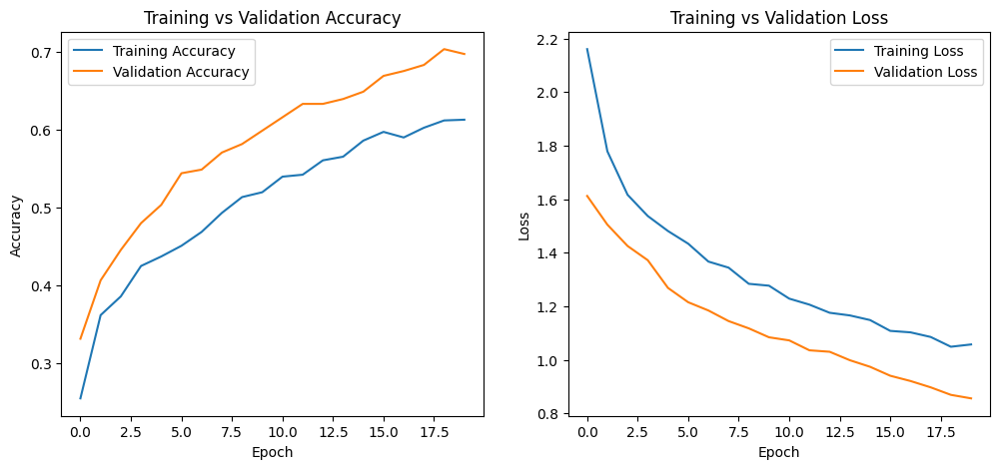

In [63]:
import matplotlib.pyplot as plt

# Accuracy
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()

plt.show()

In [64]:
print("Final Training Accuracy:", history.history['accuracy'][-1])
print("Final Validation Accuracy:", history.history['val_accuracy'][-1])

print("Final Training Loss:", history.history['loss'][-1])
print("Final Validation Loss:", history.history['val_loss'][-1])

Final Training Accuracy: 0.612500011920929
Final Validation Accuracy: 0.6968749761581421
Final Training Loss: 1.0571119785308838
Final Validation Loss: 0.8556537628173828


In [65]:
loss, accuracy = model.evaluate(valid_generator)

print("Final Validation Accuracy:", accuracy)

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.7038 - loss: 0.8581
Final Validation Accuracy: 0.703125


20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step

ACCURACY
Accuracy: 0.7031

PRECISION
Precision: 0.7034

RECALL
Recall: 0.7031

F1 SCORE
F1 Score: 0.6989

CLASSIFICATION REPORT
              precision    recall  f1-score   support

           0       0.77      0.73      0.75       128
           1       0.68      0.73      0.70       128
           2       0.70      0.54      0.61       128
           3       0.70      0.88      0.78       128
           4       0.66      0.63      0.65       128

    accuracy                           0.70       640
   macro avg       0.70      0.70      0.70       640
weighted avg       0.70      0.70      0.70       640



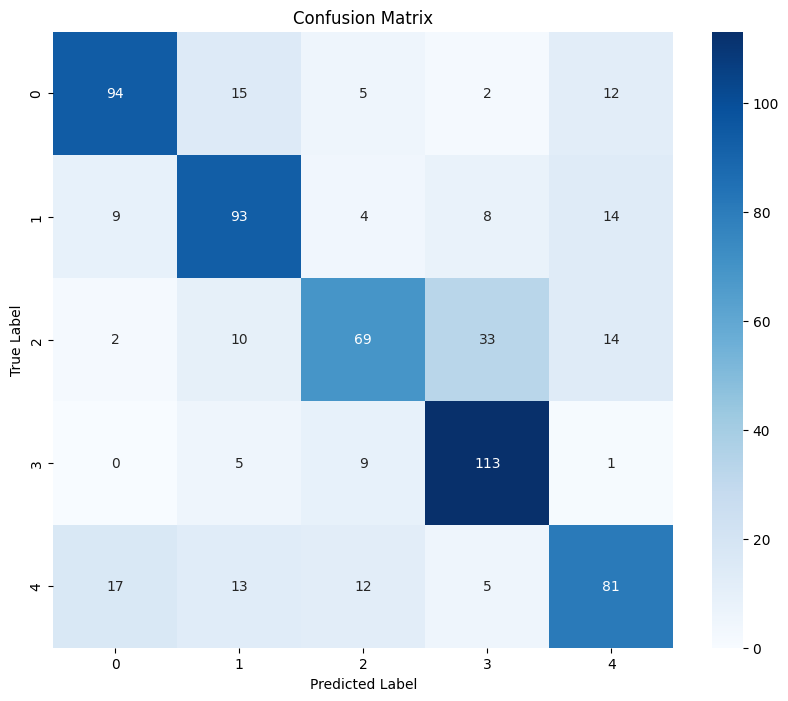

In [66]:
# =========================================================
# IMPORT LIBRARIES
# =========================================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (

    classification_report,

    confusion_matrix,

    accuracy_score,

    precision_score,

    recall_score,

    f1_score

)

# =========================================================
# RESET GENERATOR
# IMPORTANT BEFORE PREDICTION
# =========================================================

valid_generator.reset()

# =========================================================
# MODEL PREDICTIONS
# =========================================================

pred_probs = model.predict(
    valid_generator,
    verbose=1
)

# Convert probabilities to class index
pred_classes = np.argmax(
    pred_probs,
    axis=1
)

# True labels
true_classes = valid_generator.classes

# =========================================================
# ACCURACY
# =========================================================

accuracy = accuracy_score(
    true_classes,
    pred_classes
)

print("\n==============================")
print("ACCURACY")
print("==============================")

print(f"Accuracy: {accuracy:.4f}")

# =========================================================
# PRECISION
# =========================================================

precision = precision_score(
    true_classes,
    pred_classes,
    average='weighted'
)

print("\n==============================")
print("PRECISION")
print("==============================")

print(f"Precision: {precision:.4f}")

# =========================================================
# RECALL
# =========================================================

recall = recall_score(
    true_classes,
    pred_classes,
    average='weighted'
)

print("\n==============================")
print("RECALL")
print("==============================")

print(f"Recall: {recall:.4f}")

# =========================================================
# F1 SCORE
# =========================================================

f1 = f1_score(
    true_classes,
    pred_classes,
    average='weighted'
)

print("\n==============================")
print("F1 SCORE")
print("==============================")

print(f"F1 Score: {f1:.4f}")

# =========================================================
# CLASSIFICATION REPORT
# =========================================================

print("\n==============================")
print("CLASSIFICATION REPORT")
print("==============================")

class_names = list(
    valid_generator.class_indices.keys()
)

print(classification_report(

    true_classes,

    pred_classes,

    target_names=class_names

))

# =========================================================
# CONFUSION MATRIX
# =========================================================

cm = confusion_matrix(
    true_classes,
    pred_classes
)

# =========================================================
# PLOT CONFUSION MATRIX
# =========================================================

plt.figure(figsize=(10,8))

sns.heatmap(

    cm,

    annot=True,

    fmt='d',

    cmap='Blues',

    xticklabels=class_names,

    yticklabels=class_names

)

plt.title("Confusion Matrix")

plt.xlabel("Predicted Label")

plt.ylabel("True Label")

plt.show()

In [67]:
from sklearn.metrics import classification_report
import numpy as np

# Predictions
pred_probs = model.predict(valid_generator)

predictions = np.argmax(pred_probs, axis=1)

# True labels
true_labels = valid_generator.classes

# Report
print(classification_report(
    true_labels,
    predictions
))

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step
              precision    recall  f1-score   support

           0       0.77      0.73      0.75       128
           1       0.68      0.73      0.70       128
           2       0.70      0.54      0.61       128
           3       0.70      0.88      0.78       128
           4       0.66      0.63      0.65       128

    accuracy                           0.70       640
   macro avg       0.70      0.70      0.70       640
weighted avg       0.70      0.70      0.70       640



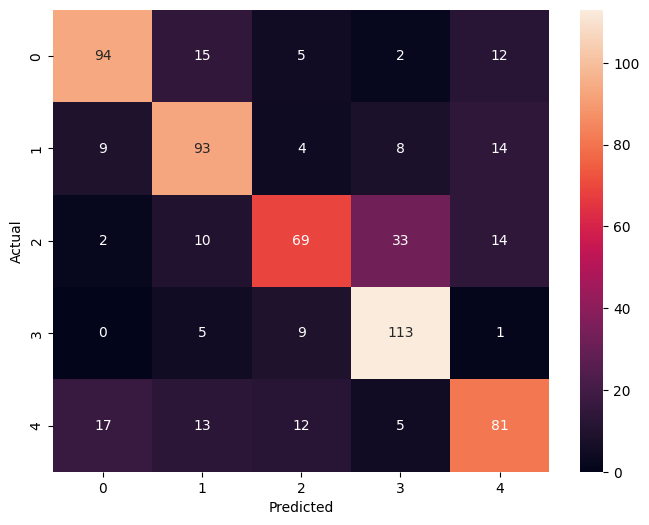

In [68]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(
    true_labels,
    predictions
)

plt.figure(figsize=(8,6))

sns.heatmap(
    cm,
    annot=True,
    fmt='d'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.show()

In [69]:
model.save(
    "/kaggle/working/plant_disease_model.keras"
)

In [70]:
import os

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames[:5]:
        print(os.path.join(dirname, filename))

/kaggle/input/datasets/aliyachomo/plant-villegedataset/label_num_to_disease_map.json
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train.csv
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test.csv
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1235188286.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1563395006.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1589421421.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1877332484.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/2319781928.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean/1058931181.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean/688489193.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean/3507045403.jpg
/kaggle/input/datasets/aliyachomo/plant-villegedataset/Train_Images_clean/137128

In [71]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

# =========================================================
# IMAGE PATH
# =========================================================

img_path = "/kaggle/input/datasets/aliyachomo/plant-villegedataset/Test_Images_clean/1058931181.jpg"

# =========================================================
# GET IMAGE NAME
# =========================================================

image_name = os.path.basename(img_path)

# =========================================================
# GET ACTUAL LABEL FROM DATAFRAME
# =========================================================

# Make sure test_df is already loaded

actual_label = test_df.loc[
    test_df['ID'] == image_name,
    'Labels'
].values[0]

# =========================================================
# LOAD IMAGE
# =========================================================

img = image.load_img(
    img_path,
    target_size=(224,224)
)

# Convert image to array
img_array = image.img_to_array(img)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# EfficientNet preprocessing
img_array = preprocess_input(img_array)

# =========================================================
# PREDICTION
# =========================================================

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction)

confidence = np.max(prediction)

# =========================================================
# DISPLAY IMAGE
# =========================================================

plt.figure(figsize=(6,6))

# Reload image for display
display_img = image.load_img(img_path)

plt.imshow(display_img)

plt.title(

    f"Actual Label: {actual_label}\n"
    
    f"Predicted Label: {predicted_class}\n"
    
    f"Confidence: {confidence:.2f}"

)

plt.axis('off')

plt.show()

IndexError: index 0 is out of bounds for axis 0 with size 0

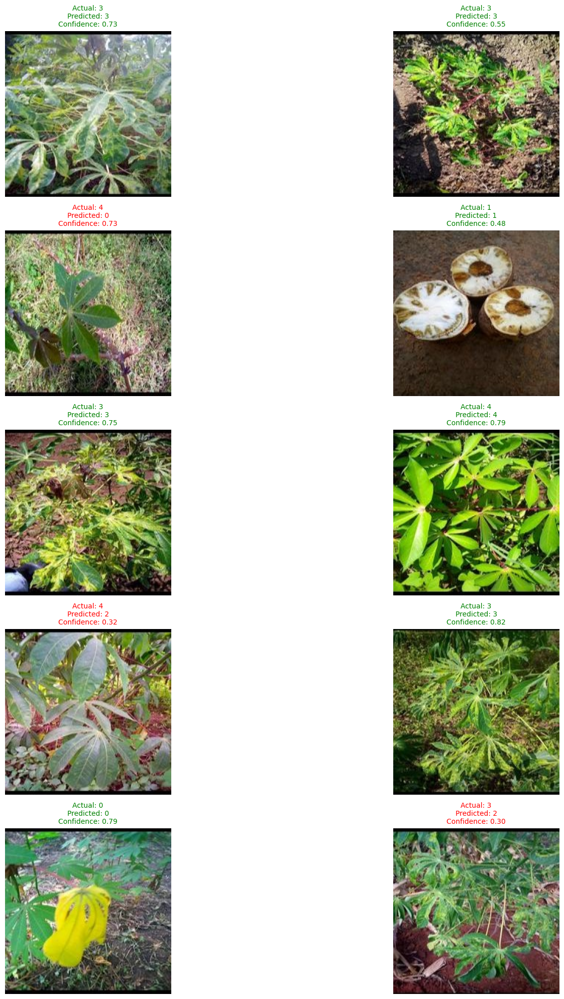

In [72]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input

import matplotlib.pyplot as plt
import numpy as np
import os
import random

# =========================================================
# SELECT 10 RANDOM IMAGES
# =========================================================

sample_df = test_df.sample(10, random_state=42)

# =========================================================
# CREATE FIGURE
# =========================================================

plt.figure(figsize=(20,20))

# =========================================================
# LOOP THROUGH IMAGES
# =========================================================

for i, row in enumerate(sample_df.itertuples(), 1):

    # Image filename
    image_name = row.ID

    # Actual label
    actual_label = str(row.Labels)

    # Full image path
    img_path = os.path.join(
        TEST_DIR,
        image_name
    )

    # =====================================================
    # LOAD IMAGE
    # =====================================================

    img = image.load_img(
        img_path,
        target_size=(224,224)
    )

    # Convert image to array
    img_array = image.img_to_array(img)

    # Add batch dimension
    img_array = np.expand_dims(img_array, axis=0)

    # EfficientNet preprocessing
    img_array = preprocess_input(img_array)

    # =====================================================
    # PREDICTION
    # =====================================================

    prediction = model.predict(
        img_array,
        verbose=0
    )

    predicted_class = str(
        np.argmax(prediction)
    )

    confidence = np.max(prediction)

    # =====================================================
    # DISPLAY IMAGE
    # =====================================================

    plt.subplot(5, 2, i)

    display_img = image.load_img(img_path)

    plt.imshow(display_img)

    # =====================================================
    # TITLE
    # =====================================================

    color = "green"

    if actual_label != predicted_class:
        color = "red"

    plt.title(

        f"Actual: {actual_label}\n"
        
        f"Predicted: {predicted_class}\n"
        
        f"Confidence: {confidence:.2f}",

        color=color,

        fontsize=10

    )

    plt.axis('off')

# =========================================================
# SHOW ALL IMAGES
# =========================================================

plt.tight_layout()

plt.show()